In [1]:
import pandas as pd
from pandas import Series,DataFrame
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from prophet import Prophet

In [2]:
df = pd.read_csv('aapl.us.txt')
df.head()

,Date,Open,High,Low,Close,Volume,OpenInt
0,1984-09-07,0.42388,0.42902,0.41874,0.42388,23220030,0
1,1984-09-10,0.42388,0.42516,0.41366,0.42134,18022532,0
2,1984-09-11,0.42516,0.43668,0.42516,0.42902,42498199,0
3,1984-09-12,0.42902,0.43157,0.41618,0.41618,37125801,0
4,1984-09-13,0.43927,0.44052,0.43927,0.43927,57822062,0


In [3]:
df_new = df.rename(columns={'Date': 'ds', 'Close' : 'y'})
m = Prophet()
m.fit(df_new)

00:31:07 - cmdstanpy - INFO - Chain [1] start processing
00:31:08 - cmdstanpy - INFO - Chain [1] done processing


In [4]:
future = m.make_future_dataframe(periods=2190)
future.tail()

,ds
10549,2023-11-05
10550,2023-11-06
10551,2023-11-07
10552,2023-11-08
10553,2023-11-09


In [5]:
df_new.shape

(8364, 7)

In [6]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
10549,2023-11-05,225.782197,209.748001,242.482710
10550,2023-11-06,225.723499,210.420582,241.547296
10551,2023-11-07,225.651692,208.835247,242.312563
10552,2023-11-08,225.656732,209.883611,241.240167
10553,2023-11-09,225.603515,208.744684,241.722413


In [7]:
forecast.shape

(10554, 19)

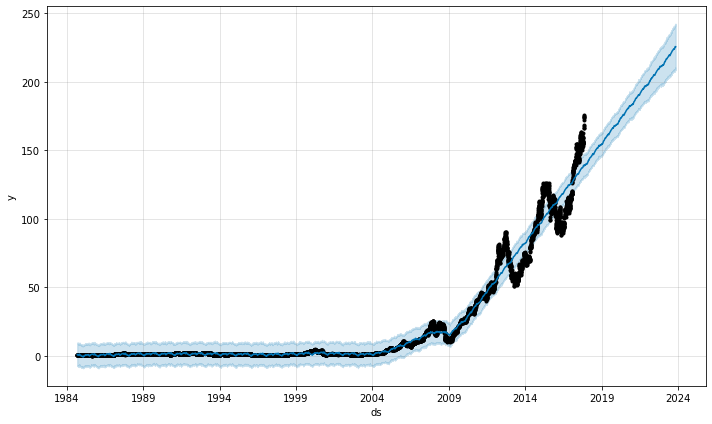

In [8]:
fig1 = m.plot(forecast)

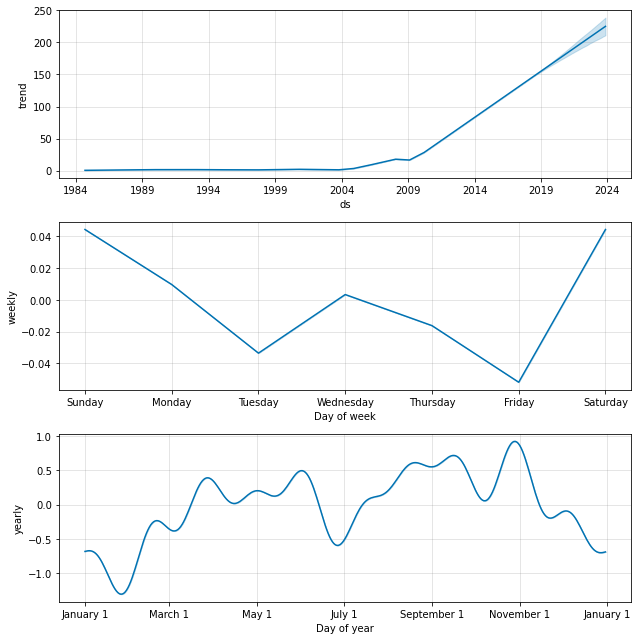

In [9]:
fig2 = m.plot_components(forecast)

In [10]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [11]:
plot_components_plotly(m, forecast)